grade: 6

# SLT-CE-4: Constant Shift Embedding

## Task

Many real-world phenomena are described by pairwise proximity data, modeling interactions between the entities of the system. This in contrast to the more common situation where each data sample is given as a feature vector. Even though the clustering of the proximity data may be performed directly on the data matrix, there are some advantatages of  embedding the data into a vector space. For example, it enables the use of some standard preprocessing techniques such as denoising or dimensionality reduction. In this coding exercise, we will explore the tecnhique called _Constant Shift Embedding_ for restating pairwise clustering problems in vector spaces [1] while preserving the cluster structure. We will apply the algorithm described in [1] to cluster the groups of research community members based on the email correspondence matrix. The data and its description is given in [2].

### References 

[1] [Optimal cluster preserving embedding of nonmetric proximity data](https://ieeexplore.ieee.org/document/1251147)

[2] [email-Eu-core](https://snap.stanford.edu/data/email-Eu-core.html)

 <h2 style="background-color:#f0b375;"> Setup </h2>

We start by importing necessary python packages.

In [1]:
import numpy as np
import sklearn as skl
import matplotlib.pylab as plt
import pylab
from mpl_toolkits.mplot3d import Axes3D
#To solve issue of small 3d figures
#%config InlineBackend.print_figure_kwargs = {'bbox_inches':None}

from sklearn.cluster import KMeans
#For plotting the eigenspectrum
from sklearn.decomposition import PCA

#For visualizing original and denoised dissimilarity matrices
import seaborn as sns

#For Hungarian Algorithm
from scipy.optimize import linear_sum_assignment

import scipy.linalg as la
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

import matplotlib.colors as mcolors

# Fix randoom seed for reproducibility
np.random.seed(42)

from sklearn.metrics import confusion_matrix 
#IMPORTED TO VISUALIZE THE CONFUSION MATRIX
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix

The number of nodes is hardcoded for simplicity (taken from [2]):

In [2]:
NUM_NODES = 1005

We load the file which contains the list of interactions between the community members (nodes). Our data matrix represents an undirected graph which connects two nodes if there was at least one email sent between the two corresponding community members. Thus our data matrix is essentially an adjacency matrix.

In [3]:
# initialize data matrix which will be an adjacency matrix
DATA = np.zeros((NUM_NODES, NUM_NODES))

# fill out the symmetric adjacency matrix
with open("email-Eu-core.txt") as file:
    for line in file:
        pair = [int(x) for x in line.split()]
        DATA[pair[0], pair[1]] = 1
        DATA[pair[1], pair[0]] = 1
        #Hence, the edge weight becomes 1 if there is such a pair specified in txt file, o.w. left as zero

#diagonals = np.zeros(NUM_NODES)
#for i in range(NUM_NODES):
    #diagonals[i] = DATA[i,i]

#print(np.sum(diagonals))
    

Note that DATA specifies an adjacency matrix of the email graph. It's not claimed to be a proper dissimilarity matrix required by CSE algorithm. So, you are allowed to perform any manipulations to construct a suitable (dis-)similarity matrix for the further analysis.

In [4]:
#Functions defined in order to symmetrize, centralize, convert or force to be positive semi definite, the similarity (or
#dissimilarity) matrices

def symmetrize(D):
    
    D_symmetric = 0.5*(D + np.transpose(D))
    
    return D_symmetric

def centralize(D):
    e_n = np.ones((NUM_NODES,1))
    q = np.identity(NUM_NODES) - (1.0/NUM_NODES)*np.ones((NUM_NODES,NUM_NODES))
    #print(q)
    D_centralized = np.matmul(np.matmul(q,D),q)
    
    return D_centralized

def convert_to_dissimilarity(D):#Based on the dissimilarity transformation pursued on the example on paper
    
    dis_mat = np.zeros(D.shape)
    
    for i in range(NUM_NODES):
        for j in range(NUM_NODES):
            dis_mat[i,j] = D[i,i] + D[j,j] - 2*D[i,j]
            
    return dis_mat

def make_psd(D):
    
    w, v = np.linalg.eigh(D)
    lambda_min = np.amin(w)
    #print(lambda_min)
    
    D_psd = D - lambda_min*np.identity(NUM_NODES)
    
    return D_psd
            
    
    
    

Next we define a class which contains main functionalities - TO BE IMPLEMENTED.

In [5]:
class ConstantShiftEmbedding(skl.base.BaseEstimator, skl.base.TransformerMixin):
    """Template class for Constant Shift Embedding (CSE)
    
    Attributes:
        PMAT (np.ndarray): Proximity matrix used for calculating the embeddings.
        S (np.ndarray): Similarity matrix.
        D (np.ndarray): Dissimilarity matrix.
        
    """
    
    def __init__(self):
        self.PMAT = None
        self.S = None
        self.D = None
        self.S_centralized = None
        self.S_tilde = None
        self.D_tilde = None
        self.S_tilde_centralized = None
        self.X_p = None
        self.w_leading = None
        self.V = NUM_NODES
        self.graph = None
        # Add/change parameters, if necessary.
    
    def fit(self, PMAT):
        """ Calculate similarity/dissimiliarity matrix and all
        the necessary variables for calculating the embeddings.
        
        Args:
            PMAT (np.ndarray): proximity matrix
        """

        # Save data
        self.PMAT = PMAT#Becomes DATA, i.e. the adjacency matrix
        self.graph = PMAT.copy()
        #self.graph[self.graph == 0] = 1e3#ALGORITHM TAKES THESE AS ZERO
        for i in range(NUM_NODES):
            self.graph[i,i] = 0
        
        ## IMPLEMENT THIS METHOD        
           
        #for i in range(1,NUM_NODES):
            #self.PMAT[i,i] = 0
        alpha = 0.98#SIMILARITY MEASURE FROM PAPER
        w, v = np.linalg.eigh(self.PMAT)
        lambda_1 = np.amax(w)
        #print('lambda_1',lambda_1)
        coef = 2*np.sum(self.PMAT)*lambda_1
        temp_mat = np.linalg.inv(np.identity(NUM_NODES)-(alpha/lambda_1)*self.PMAT)
        diagonals = []
        Diag = np.zeros((NUM_NODES,NUM_NODES))
        for i in range(NUM_NODES):
            neigh_nodes = self.PMAT[i,:]
            diagonals.append(np.sum(neigh_nodes))
        np.fill_diagonal(Diag,diagonals)
        counter = 0
        #for i in range(NUM_NODES):
            #if Diag[i,i] == 0:
                #print('YESSS')
                #Diag[i,i] = 1
                #counter = counter + 1
        #print('counter', counter)
        #print(Diag)
        temp_matrix = np.matmul(np.linalg.inv(Diag),temp_mat)
        self.S = coef * np.matmul(temp_matrix, np.linalg.inv(Diag))
        #np.savetxt("Similarity.csv", self.S, delimiter=",")
        self.S[self.S >= 600] = 600#Threshold few large values which are mainly on the diagonals to tackle computational issues regarding D matrix
        #Since every node is naturally in the same network with themselves, their similarity values can occasionally explode which we don't want for numerical issues
        #self.S = self.S*(0.1)
        #temp = self.S.copy()
        #diagonal_elements = []
        #for i in range(NUM_NODES):
            #temp[i,i]=0
        #mean_off_diagonal = np.mean(temp)
        #print('mean_diagonal',mean_off_diagonal)
        #for i in range(NUM_NODES):
            #self.S[i,i] = mean_off_diagonal
        
            
        #self.S = self.PMAT.copy()#Similarity matrix we start with as per our adjacency measurements
        #print(self.S)
        
     
    
        #self.D = np.zeros((NUM_NODES, NUM_NODES))
    
        self.D = convert_to_dissimilarity(self.S)#The dissimilarity matrix required for pairwise clustering cost and CSE  

        #Check zero diagonals and symmetricity of D  
        
        n=NUM_NODES
        #print(np.trace(self.D))
        #print(np.allclose(self.D, np.transpose(self.D)))
        
        self.S_centralized = -(0.5)*centralize(self.D)
        #Check if symmetrized
        #print(np.allclose(self.S_centralized, np.transpose(self.S_centralized)))
        #print(np.allclose(self.S_centralized,-0.5*centralize(self.D)))
        #Check if centralized
        #print(np.allclose(np.sum(self.S_centralized, axis=0),0))
        #print(np.allclose(np.sum(self.S_centralized, axis=1),0))
        #print(np.max(np.sum(self.S_centralized, axis=0)))
        #print(np.max(np.sum(self.S_centralized, axis=1)))
        
        self.S_tilde = make_psd(self.S_centralized)
        
        self.D_tilde = convert_to_dissimilarity(self.S_tilde)
        
        
        w, v = np.linalg.eigh(self.S_centralized)
        lambda_min = np.amin(w)
        #print(np.allclose(self.D_tilde, self.D - 2*lambda_min*(np.ones((NUM_NODES,NUM_NODES))-np.identity(NUM_NODES))))
       
    def get_embedded_vectors(self, p):
        """Return embeddings
        
        Args:
            p (np.ndarray): cut-off value in eigenspectrum
        
        Returns:
            Xp (np.ndarray): embedded vectors
        
        """
        
        ## IMPLEMENT THIS METHOD
        self.S_tilde_centralized = (-0.5)*centralize(self.D_tilde)
        #print('True centralization:',np.allclose(self.S_tilde_centralized, (-0.5)*centralize(convert_to_dissimilarity(self.S_tilde))))
        w_rec, v_rec = np.linalg.eigh(self.S_tilde_centralized)
        #print('Original eigenvalues:',w_rec.shape)
        #print('min eigenvalue:',np.min(w_rec))
        
        w_rec_leading = np.flip(np.sort(w_rec)[-p:])
        #print(np.max(w_rec))
        #print(np.max(w_rec_leading))
        selected_indices = np.flip(np.argsort(w_rec)[-p:])
        #print('selected eigenvalues',w_rec_leading.shape)
        self.w_leading = w_rec_leading.copy()
        
        V_p = v_rec[:,selected_indices]
        #print('V_p shape', V_p.shape)
        #print(w_rec_leading)
        
        Lambda_p = np.zeros((V_p.shape[1], V_p.shape[1]))
        np.fill_diagonal(Lambda_p, np.sqrt(w_rec_leading))
        #print(Lambda_p)
        
        self.X_p = np.matmul(V_p.astype('float'), Lambda_p.astype('float'))
        
        return self.X_p.copy()
    
    def get_leading_eigenvectors(self):
        
        return self.w_leading

        

In the implementation of CSE, various similarity measures for the S matrix were tested and ultimately, due to emprical and intuitive reasons related to the nature of the network analysis problem we are given, the Leicht-Holme-Newman Index was chosen. This methodology for this index argues that while comparing the graph-based structural similarity of networks, we need to take into account how similar vertices are via their relation to their adjacent vertices even if they aren't structurally very similar in the sense that they don't have similar structural connections in the network. Thus, this similarity measure stems from the heuristic that two vertices in a network are similar if their adjacent nodes are somehow similar which leads to the notion of a recursively defined similarity given as: $S_{ij}=\phi\sum_{v}A_{iv}S_{vj}+\gamma\sigma_{ij}$ where $A_{iv}$ is the adjacency matrix, $\sigma_{ij}$ is the Kronecker Delta and $\phi,\gamma$ are free parameters. Clearly, this could be a natural similarity measure for our community detection problem since members of the same community are expected to have similar neighbours. Moreover, as presented in the associated paper, this definition of the similarity measure is reduced to $2m\lambda_1D^{-1}(I-\frac{\alpha}{\lambda_1}A)^{-1}D^{-1}$ where $m$ is the total number of edges in the graph, $\lambda_1$ is the largest eigenvalue of the adjacency matrix $A$, $D$ is the diagonal matrix containing the degree of the vertices and $\alpha$ is a paremeter chosen typically in the range of $[0.9,1.0]$. It is clear that this metric is not only suited to out problem, but is also computable efficiently from our given measurements, DATA.


<h2 style="background-color:#f0b375;">
Section 4.0 
<span style=font-size:50%> Complete all problems in this section to get a pass on this exercise. </span>
</h2>

<p style="background-color:#adebad;">Describe briefly and consicely the model given in [1]. Explain the main steps of _Constant Shift Embedding_ algorithm. See <a href="https://medium.com/ibm-data-science-experience/markdown-for-jupyter-notebooks-cheatsheet-386c05aeebed">markdown cheatsheet</a> for text editing.</p>

- **Constant Shift Embedding**: Constant Shift Embedding (CSE) is a tool relying on the equivalence of pairwise clustering of priximity data and Kmeans clustering on some associated and to-be-constructed embedding space. In many applications, the data is given in as a proximity data where each item is explianed through their pairwise relations with respect to other items and they can't be heuristically represented in some feature space. These proximity relations don't follow the necessary conditions of previously encountered metrics on feature spaces and in general, do not induce any applicable theory on how to cluster the given proximity data, especially since the relations and the cost is in the order $\mathcal{O}(n^2)$. However, the CSE method, manipulates the analogy of the pairwise clustering cost function to the kmeans cost function which reduces the complexity to $\mathcal{O}(n)$, meaning that partial cost contributions are additive in the number of objects. Furthermore, as per the special properties of this cost function such as scale and shift invariance, the CSE method can in general convert the given proximity data into a vectorial representation in an unknown embedding space where we can equivalently pursue kmeans and moreover, have all the theory to denoise, or reduce the dimension of the data for clustering purposes. 

The presented model starts off by presenting the Pairwise Clustering Cost Function, which is given as:

$H^{PC}=\frac{1}{2}\sum_{\nu=1}^{k}\frac{\sum_{i=1}^{n}\sum_{i=1}^{n}M_{i\nu}M_{j\nu}D_{ij}}{\sum_{l=1}^{n}M_{l\nu}}$

where $M_{i\nu}$ is an indicator of object $i$ being in cluster $\nu$ and $D_{ij}$ is a dissimilarity measure between the proximity data $i$ and $j$. Moreover the paper proves the equivalence of the kmeans cost function, $H^{KM}=\sum_{\nu=1}^{k}\sum_{i=1}^{n}M_{i\nu}\| x_i - y_\nu \|^2$ to the pairwise clustering cost function above in the case where $D_{ij}=\| x_i - x_j \|^2$ by exploiting the fact that $y_{\nu}:=\frac{\sum_{j=1}^{n}M_{j\nu}x_j}{\sum_{l=1}^{n}M_{l\nu}}$ and rewriting the term $\| x_i - y_\nu \|^2$ by expanding it through the linearity properties of standard inner product inducing the $l_2$ norm. This equaivalence sparks the hope that if we can indeed embed the proximity data in some embedding space with the dissimilarity matrix satisfying $D_{ij}=\| x_i - x_j \|^2$, then we can indeed have the above desired properties applicable for our pairwise clustering problem.

Next, the invariance of $H^{PC}$ under symmetrizing transformations, $\tilde{D}_{ij}=\frac{1}{2}(D_{ij}+D_{ji})$ and the invariance of $H^{PC}$ (up to a constant) under the shift of off-diagonal elements, $\tilde{D}_{ij}=D_{ij}+d_0(1-\sigma_{ij})$. In either case, since costs up to the same constant induce the same values in the resulting Gibbs distribution, the same optimal clustering assignments are obtained. 

These properties allow us to consider, without loss of generality and without having to worry about alteration of the cluster assignments, a symmetrized dissimilarity matrix with zero diagonal elements summarizing the proximity data. Then, the CSE Algorithm follows the following steps:

1)Apply the decomposition $D_{ij}=S_{ii}+S_{jj}-2S_{ij}$. This clearly defines a unique equivalence class $\mathcal{S}_D$ of induced similarity matrices $S$. It is clear that the centralized similarity matrix $S^C$, given by $S^C=(I_n-\frac{1}{n}e_ne_n^T)S(I_n-\frac{1}{n}e_ne_n^T)$ is included in this equivalence class. We will choose this particular similarity matrix and the reason will become clear in the following steps.

2)S is centralized in accordance with the above choice. Using the fact that $S^C=(I_n-e_ne_n^T)S(I_n-e_ne_n^T) = S_{ij}-\frac{1}{n}\sum_{k=1}^{n}{P_{ik}}-\frac{1}{n}\sum_{k=1}^{n}{P_{kj}}+\frac{1}{n^2}\sum_{k,l=1}^{n}{P_{kl}}$ and plugging in the definition $S_{ij}=\frac{-1}{2}(S_{ii}S_{jj}-D_{ij})$ it is derived that $S^C = \frac{-1}{2}D^C$, which means that $S^C$ can easily and uniquely be computed from any given dissimilarity matrix.

3)Convert $S^C$ into a p.s.d. matrix via the transformation $\tilde{S}=S^C - \lambda_n(S^C)I_n$ where $\lambda_n(S^C)$ is the minimum eigenvalue of the matrix $S^C$. This step forces $S^C$ into becoming a psd matrix by simply forcing the smallest eigenvalue of $S^C$ to becoming zero and obviously, the rest to be greater than zero. We note that although this ia a diagonal transformation, it vanishes out in the transformation $D_{ij}=S_{ii}+S_{jj}-2S_{ij}$ and doesn't reflect upon the dissimilarity matrix so that the cost is still invariant. 

4)Following the transformation in step 3, $\tilde{S}$, being a symmetric psd matrix, satisfies the necessary and sufficient conditions of denoting a kernel on some unknown embedding space with $\tilde{S}=x_i^Tx_j$ where $x_i,x_j$ are any such two embedded vectors from the original proximity data. Then, once we apply the transformation, $\tilde{D}_{ij}=\tilde{S}_{ii}+\tilde{S}_{jj}-2\tilde{S}_{ij}$, we obtain $\tilde{D}_{ij}=\| x_i |^2+\| x_j |^2-2x_i^tx_j=\| x_i-x_j |^2$. 

So, following these steps, the CSE algorithm successfully embeds the proximity data in some euclidian space in which case the dissimilarity matrix is converted automatically into a pairwise euclidian distance matrix of the corresponding embedded vectors. Thus, we satisfy our initial desideratum which was $D_{ij}=\| x_i - x_j \|^2$ and since the whole CSE algorithm fits the invaraince properties of the pairwise clustering cost function, we ulitmately have the chance to perform kmeans on the equivalent embedded space to attain the same cluster assignments. Moreover, we can now utilize all the theory on feature spaces to refine the data for dimensionality reduction or noise reduction purposes which were completely ambigous on the proximity data. Consequently, we have the overall transformation, $\tilde{D}=D-2\lambda_n(S^C)(e_ne_n^T-I_n)$. Here, we observe the motivation for choosing $S^C$ in earlier steps. If we had chosen any other $S\epsilon \mathcal{S}_D$, the resulting minimum eigenvalue chosen in order to have a square euclidian distance interpretation of $D$, would be guranteed to be larger than $2\lambda_n(S^C)$ (by the Minimal Shift Theorem) which would be unfavorable since it would cause a larger shift of off-diagonal elements of $D$. This could cause an explosion of dissimilarity values and cause undesired amplification of the noise in the proximity data which is in general hard to anticipate.

While de described procedure so far sums up the CSE method, the paper further elaborates on the usefulness of this method on reconstructing the embedded vectors to which we project our proximity data. Since $\tilde{S}=XX^T$ denotes a kernel in some yet-to-be constructed embedding space X, by using the duality between $S^C$&$D^C$ and $\tilde{S}^C$&$\tilde{D}^C$, we can write $\tilde{S}^C=\frac{-1}{2}\tilde{D}^C$ and centralize our kernel in accordance with the underlying KPCA approach. Moreover, writing $\tilde{S}^C = V\Lambda V^T$ via its EigenValue Decomposition, we can represent the unknown embedded vectors in terms of their eigenbasis since we have $XX^T=V\Lambda V^T\Rightarrow X_p = V_p\Lambda_p^{\frac{1}{2}}$ where we loslessly obtain the p leading eigenvectors corresponding to the p non-zero eigenvalues of this centralized and psd kernel matrix.

Hence, this overall model presented in the paper, offers a well generalizbale method for a wide class of invariant cost functions and a wider class of dissimilarity matrices in order to embed the data in a euclidian space and equivalently carry out the clustering procedure in that space with all the necessary tools and theory available to enhance the clustering performance in that constructed feature space such as denoising or dimensionality reduction tools including PCA. 

<p style="background-color:#adebad;">
    Implement Constant Shift Embedding. We start off by making an instance of the corresponding class.
</p>    

In [6]:
CSE = ConstantShiftEmbedding()

<p style="background-color:#adebad;">
    Fit the data matrix. _fit(...)_ method computes necessary variables which can be later on used to produce embeddings [1].
</p>    

In [8]:
CSE.fit(DATA)
#print(np.linalg.matrix_rank(CSE.S))
print(np.sum(CSE.S==600))

1516


<h2 style="background-color:#f0b375;">
Section 4.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 4.5 </span>
</h2>

<p style="background-color:#adebad;">
    Next, try to find approximately optimal $p = p^∗$, a cut-off value which removes noise from the data. To do that, produce an eigen-spectrum plot as shown in [1] figure 4a and briefly explain your choice of $p^∗$.
</p>

In [9]:
## Compute eigen-spectrum
X_p = CSE.get_embedded_vectors(p=NUM_NODES)#Initially, losslessly take all the eigenvectors to apply PCA to them
print(X_p)
#pca = PCA(n_components = X_p.shape[0]-1)
#pca.fit(X_p)
#eigen_spectrum = pca.explained_variance_
eigen_spectrum = np.sort(CSE.get_leading_eigenvectors())[::-1]
#print(eigen_spectrum)

[[ 2.06777838e+00 -1.44560438e+00  1.75904172e-01 ... -1.80279989e-02
   2.30143954e-07             nan]
 [-4.78424464e-01 -1.38283967e+00  8.53431283e-01 ... -3.22449208e-03
   2.40438804e-07             nan]
 [-3.29239672e-01  2.31348426e+00 -3.78061476e+00 ... -4.21556538e-03
   2.32123897e-07             nan]
 ...
 [ 3.62511752e+00  5.21418964e-02  6.53696147e-01 ... -9.57052500e-03
   2.18099054e-07             nan]
 [ 1.11083227e+00  4.24561280e-01  1.67491329e-01 ... -8.81609943e-03
   2.12714638e-07             nan]
 [ 3.34255797e+00  1.65780625e+00 -2.87987179e+00 ... -1.28811240e-02
   2.09900616e-07             nan]]


/opt/anaconda3/envs/slt-ce/lib/python3.5/site-packages/ipykernel_launcher.py:144: RuntimeWarning: invalid value encountered in sqrt


In [10]:
## Determine a good cut-off value (and write some lines to explain your choice)
p_opt = 8 ## change accordingly
print("Chosen cut-off value is: ", p_opt)

Chosen cut-off value is:  8


As discussed in the paper, while performing dimensionality reduction via PCA, we assume that the noise dominated information that distorts the clustering process is contained in the components with lower explained variance, i.e. smaller eigenvalues. In the example given in the paper, the threshold value was chosen a rather small value since the eigen spectrum showed a 5-fold decrease in the first 10 components. In this question, we also face a similar occurence where the eigenvalues decrease sharply (more than 4-fold) in the first few components. Therefore, following the heuristic in the paper, our initial guess was to choose the cutoff value around 10 components as we again had a very similar trend in the eigenspectrum where we had a clear indication that only these few larger-variance components contained the useful information on the embedded vectors in terms of a clustering principle. Moreover, the rest of the components up until the 1005th component had comparable and relatively much smaller variance explained. Even so, the performance of the kmeans clustering is dependent on the small variaitons in the choice of the optimal cutoff value. We need to make sure that we don't set $p^*$ very low such that some useful (signal dominated) components aren't left out nor choose $p^*$ unnecessarily high such that additional noisy components are introduced which worsens the clustering performance. Therefore, various values within a close range of ~10 principal components were tried out and the final parameter $p^*$ was fine-tuned with respect to the clustering performance and the visualization quality of the cluster assignments. Here, it is further observed that, keeping unncessarily many principle components results in the noisy correlations of individuals in the communities to be taken into account which is more destructive than keeping a rather smaller number of principle components. Thus, we try to avoid setting $p^*$ unnecessarily large.

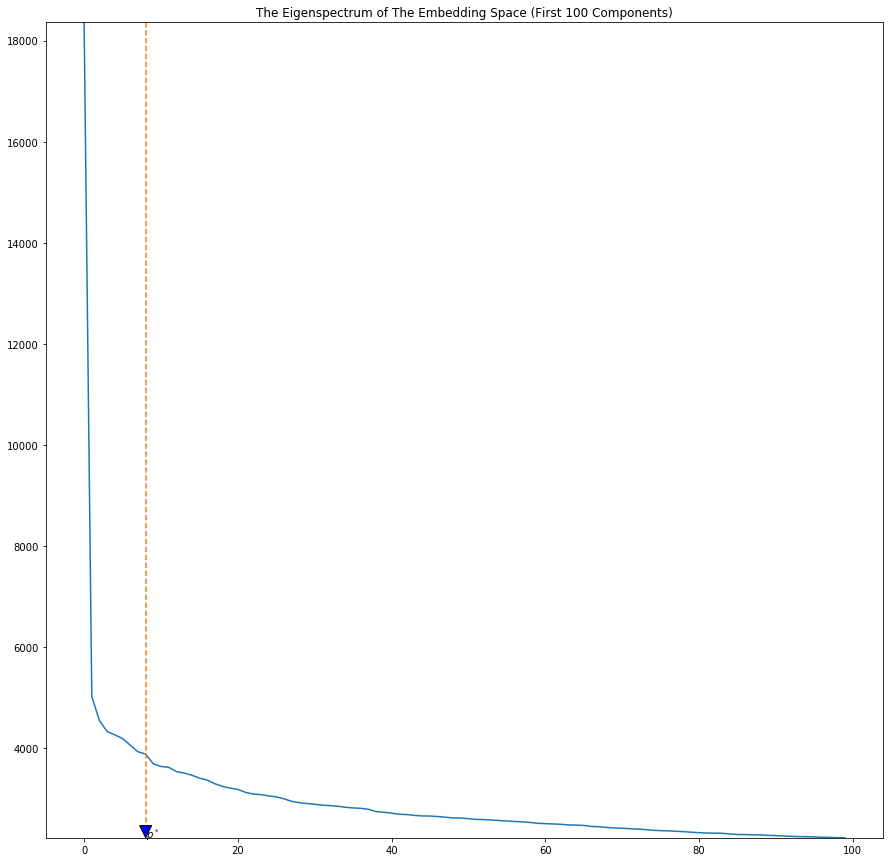

In [12]:
## Plot spectrum and indicate the cut-off value on the spectrum
limiter = 100#Determines up until which eigenvalue the eigenspectrum is going to be plotted
a = np.min(eigen_spectrum[:limiter:])
b = np.max(eigen_spectrum[:limiter:])
fig, ax = plt.subplots(figsize=(15,15))
ax.set_title('The Eigenspectrum of The Embedding Space (First '+str(limiter)+' Components)')
ax.plot(np.arange(len(eigen_spectrum[:limiter:])), eigen_spectrum[:limiter:])
ax.plot(p_opt*np.ones(len(eigen_spectrum[:limiter:])), eigen_spectrum[:limiter:], linestyle='dashed')
ax.annotate('$p^*$', xy=(p_opt,a), xytext=(p_opt,a-0.003),arrowprops=dict(facecolor='blue', shrink=0.05),)
plt.ylim([a,b])
plt.show()

<h2 style="background-color:#f0b375;">
Section 5.0 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5.0 </span>
</h2>

<p style="background-color:#adebad;">
    Plot the distance matrices both for the denoised ($p = p^*$ -- from the previous step) and the original versions as shown in figure 5 in [1]. Note that the distance matrix is a matrix with pairwise distances between every two points from the dataset ($d_{ij} = dist(x_i, x_j)$).<br>
    Perform K-MEANS algorithm for varying number of clusters K on the embedded vectors derrived from CSE. You may use the sklearn implementation of K-MEANS. To make the aforementioned plots meaningful, sort the nodes according to the cluster belongings for every number of clusters K (see the figure 5). For now, there is no need to include the actual ground truth labels given in [2].
</p>

True
(1005, 1005)
True
(1005, 1005)
0
True
(1005, 1005)
True
(1005, 1005)
1
True
(1005, 1005)
True
(1005, 1005)
2
True
(1005, 1005)
True
(1005, 1005)
3
True
(1005, 1005)
True
(1005, 1005)
4
True
(1005, 1005)
True
(1005, 1005)
5


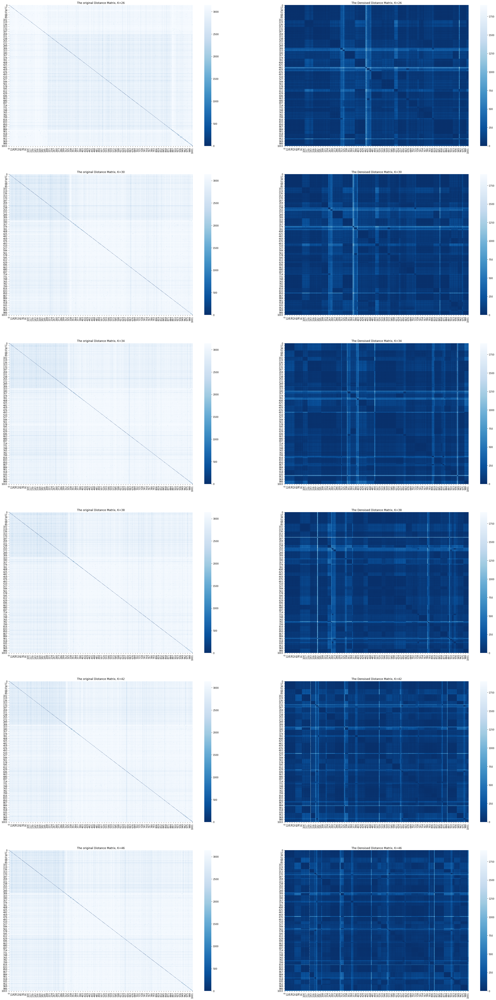

In [13]:
## Distance matrices

cluster_options = [26, 30, 34, 38, 42, 46]
#cluster_options = [4, 6, 8, 10, 12, 14]

fig, ax = plt.subplots(len(cluster_options),2,figsize=(40,80))
g = ax.copy()

X_p = CSE.get_embedded_vectors(p=NUM_NODES-1)
X_p_denoised = CSE.get_embedded_vectors(p=p_opt)
counter = 0

for k in cluster_options:
    
    kmeans1 = KMeans(n_clusters=k, random_state=0).fit(X_p)
    labels = kmeans1.predict(X_p)
    #print(labels.shape)
    #plt.bar(np.histogram(labels, bins=k+1)[0],np.arange(k+1))
    #plt.show()
    indices_sorted = np.argsort(labels)
    S_tilde = np.matmul(X_p, np.transpose(X_p))
    D_tilde = convert_to_dissimilarity(S_tilde)
    print(np.allclose(-2*S_tilde, centralize(D_tilde)))
    D_tilde_sorted_temp = D_tilde[:,indices_sorted]
    D_tilde_sorted = D_tilde_sorted_temp[indices_sorted,:]
    print(D_tilde_sorted.shape)
    
    kmeans2 = KMeans(n_clusters=k, random_state=0).fit(X_p_denoised)
    labels_denoised = kmeans2.predict(X_p_denoised)
    indices_sorted_denoised = np.argsort(labels_denoised)
    S_tilde_denoised = np.matmul(X_p_denoised, np.transpose(X_p_denoised))
    D_tilde_denoised = convert_to_dissimilarity(S_tilde_denoised)
    print(np.allclose(-2*S_tilde_denoised, centralize(D_tilde_denoised)))
    D_tilde_denoised_sorted_temp = D_tilde_denoised[:,indices_sorted_denoised]
    D_tilde_denoised_sorted = D_tilde_denoised_sorted_temp[indices_sorted_denoised,:]
    print(D_tilde_denoised_sorted.shape)#Still symmetric and zero diagonal, was checked
    
    g[counter,0] = sns.heatmap(D_tilde_sorted, ax=ax[counter,0],cmap="Blues_r")
    g[counter,0].set_title('The original Distance Matrix, K='+str(k))
    g[counter,1] = sns.heatmap(D_tilde_denoised_sorted, ax=ax[counter,1],cmap="Blues_r")
    g[counter,1].set_title('The Denoised Distance Matrix, K='+str(k))
    
    print(counter)
    
    counter = counter + 1



On this section, we notice that no matter the number of clusters used, the original distance matrix reconstructed in a lossless fashion from the embedded vectors has no apparent cluster structure when reorganized with respect to KMEANS label assignments. This is primarily due to the fact that there are overwhelmingly more noisy principal components used for clustering compared to the signal dominated components which causes poor performance during clustering. On the other hand, the distance matrix reconstructed using the first $p^*$ components present a much more detailed and clear hierarchial structure of the clustered segments as anticipated since it can capture the essential statistics of the correlations and relational info of the given individuals. Thus, our denoising strategy via PCA is clearly useful in emphasizing the clustering structures. We notice that for lower number of clusters used, larger clusters are naturally formed whereas for larger number of clusters allowed, these larger groups are further divided into smaller clusters hierarchially.


<h2 style="background-color:#f0b375;">
Section 5.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5.5 </span>
</h2>

<p style="background-color:#adebad;">
    Producing 2D and 3D embeddings allows us to nicely visualize generated clusters. Now calculate the embeddings for p = 2 (2D case) and p = 3 (3D case) and plot clusterings for a few values of K.  Alternatively, you could use $p = p^*$ for more gentle denoising, cluster the denoised embeddings and only then apply a dimensionality reduction technique to get a plot in 2,3-dimensional space. You could use PCA, LLE, t-SNE etc. figure out what works for you. As an example see figure 6 (b) from [1] where CSE is combined with PCA.
</p>

In [12]:
## Get embeddings, run K-MEANS and generate plots

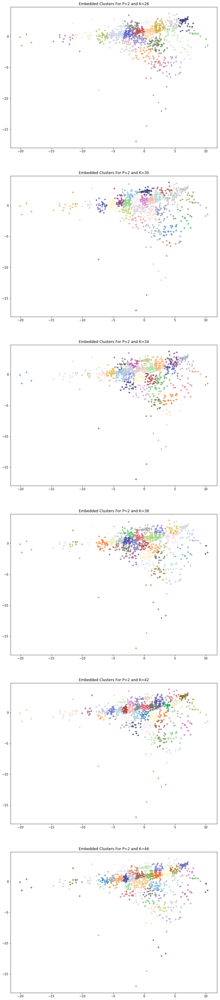

In [14]:
## p = 2
colors1 = plt.cm.tab20b(np.linspace(0., 1, 20))
colors2 = plt.cm.tab20c(np.linspace(0., 1, 20))
colors3 = plt.cm.Pastel1(np.linspace(0., 1, 9))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2,colors3))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

cluster_options = [26, 30, 34, 38, 42, 46]

fig, ax = plt.subplots(len(cluster_options),1,figsize=(60,60))
counter = 0

for k in cluster_options:
    X_p_denoised_plot = CSE.get_embedded_vectors(p=2)
    kmeans = KMeans(n_clusters=k, random_state=13).fit(X_p_denoised_plot)
    labels = kmeans.predict(X_p_denoised_plot)
    ax[counter].scatter(X_p_denoised_plot[:, 0], X_p_denoised_plot[:, 1], c=labels, s=40, cmap=mymap, marker='+')
    ax[counter].set_title('Embedded Clusters For P=2 and K='+str(k))
    ax[counter].set_aspect(1.0)
    counter = counter + 1

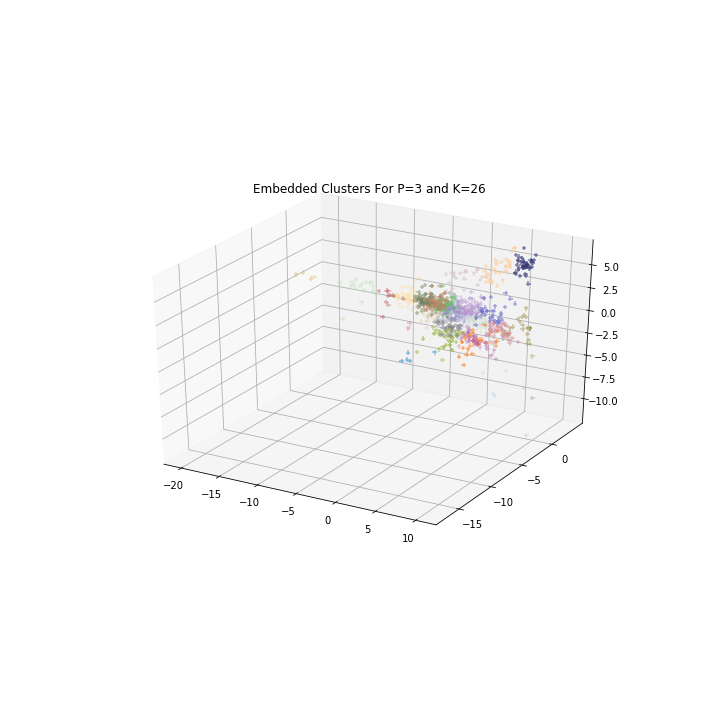

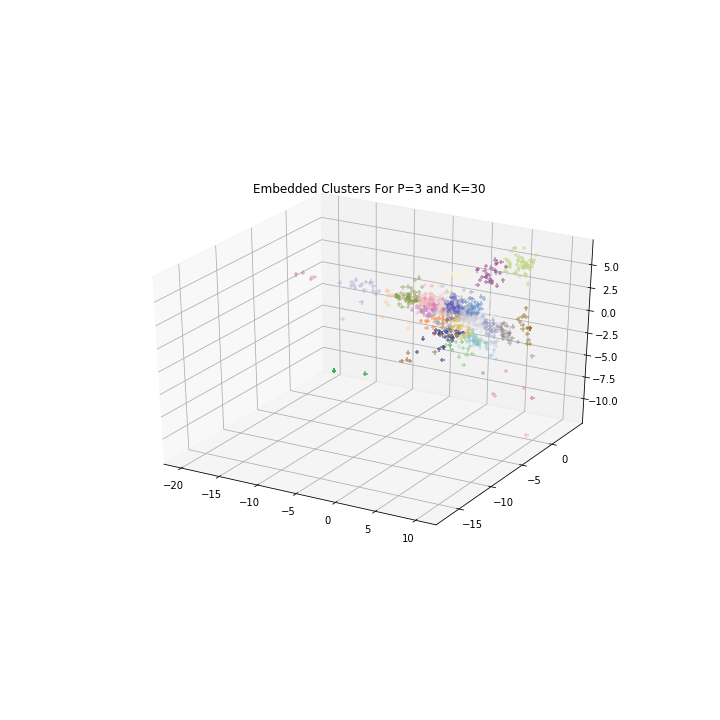

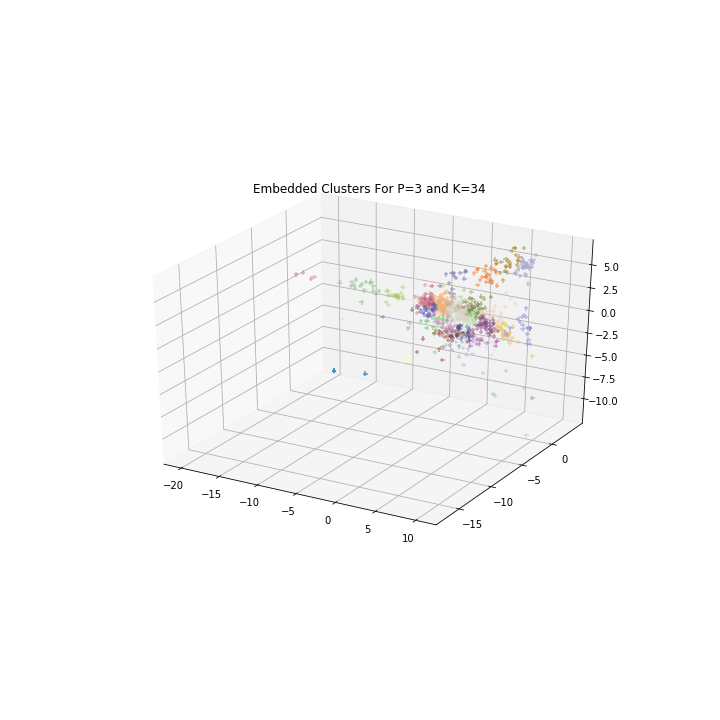

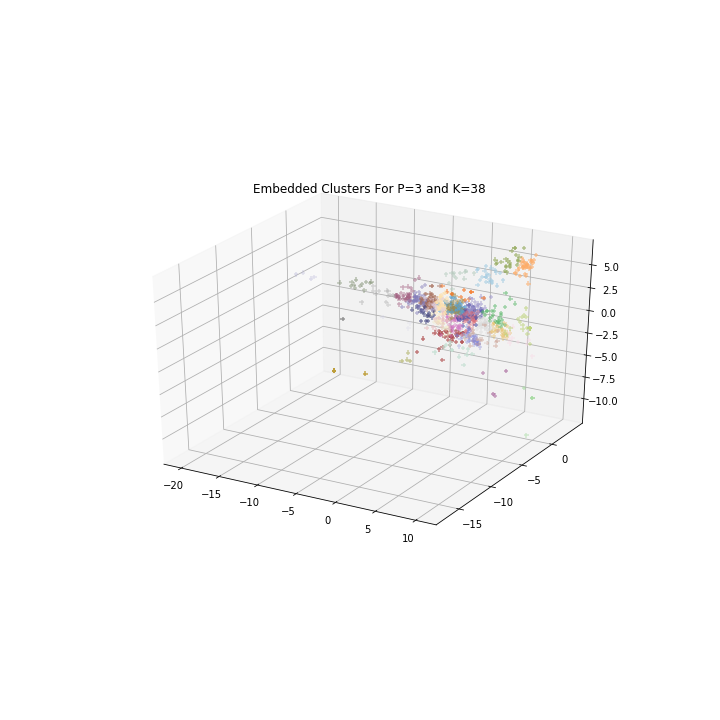

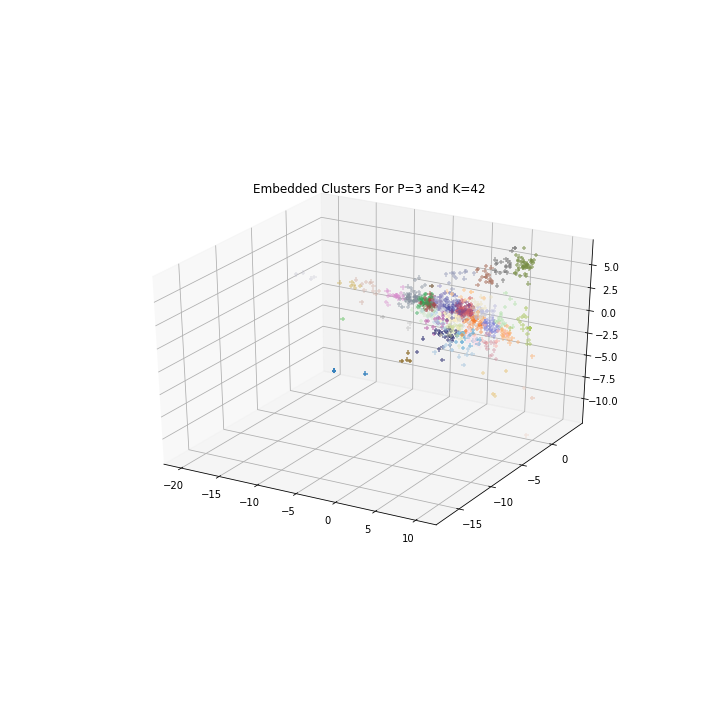

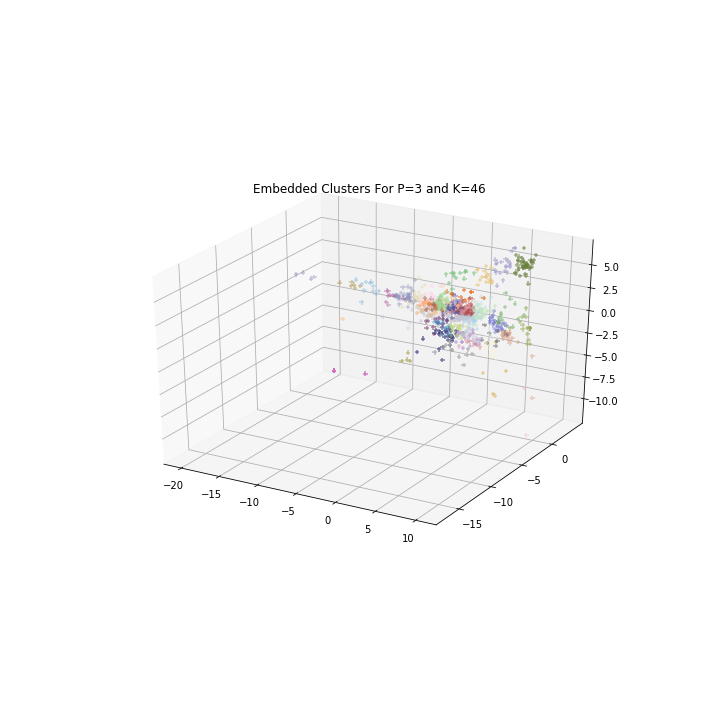

In [15]:
## p = 3
%config InlineBackend.print_figure_kwargs = {'bbox_inches':None}
cluster_options = [26, 30, 34, 38, 42, 46]


#fig, axes = plt.subplots(len(cluster_options),1,figsize=(60,60))
counter = 1

for k in cluster_options:
    X_p_denoised_plot = CSE.get_embedded_vectors(p=3)
    kmeans = KMeans(n_clusters=k, random_state=13).fit(X_p_denoised_plot)
    labels = kmeans.predict(X_p_denoised_plot)
    if k == 26:
        fig1 = plt.figure(figsize=(10,10))
        ax1 = fig1.add_subplot(111, projection='3d')
        ax1.scatter(X_p_denoised_plot[:, 0], X_p_denoised_plot[:, 1], X_p_denoised_plot[:, 2], c=labels, cmap=mymap, marker='+')
        ax1.set_title('Embedded Clusters For P=3 and K='+str(k))
        ax1.set_aspect(1.0)
        
    if k == 30:
        fig2 = plt.figure(figsize=(10,10))
        ax2 = fig2.add_subplot(111, projection='3d')
        ax2.scatter(X_p_denoised_plot[:, 0], X_p_denoised_plot[:, 1], X_p_denoised_plot[:, 2], c=labels,  cmap=mymap, marker='+')
        ax2.set_title('Embedded Clusters For P=3 and K='+str(k))
        ax2.set_aspect(1.0)
       
    if k == 34:
        fig3 = plt.figure(figsize=(10,10))
        ax3 = fig3.add_subplot(111, projection='3d')
        ax3.scatter(X_p_denoised_plot[:, 0], X_p_denoised_plot[:, 1], X_p_denoised_plot[:, 2], c=labels,  cmap=mymap, marker='+')
        ax3.set_title('Embedded Clusters For P=3 and K='+str(k))
        ax3.set_aspect(1.0)
        
    if k == 38:
        fig4 = plt.figure(figsize=(10,10))
        ax4 = fig4.add_subplot(111, projection='3d')
        ax4.scatter(X_p_denoised_plot[:, 0], X_p_denoised_plot[:, 1], X_p_denoised_plot[:, 2], c=labels, cmap=mymap, marker='+')
        ax4.set_title('Embedded Clusters For P=3 and K='+str(k))
        ax4.set_aspect(1.0)
       
    if k == 42:
        fig5 = plt.figure(figsize=(10,10))
        ax5 = fig5.add_subplot(111, projection='3d')
        ax5.scatter(X_p_denoised_plot[:, 0], X_p_denoised_plot[:, 1], X_p_denoised_plot[:, 2], c=labels, cmap=mymap, marker='+')
        ax5.set_title('Embedded Clusters For P=3 and K='+str(k))
        ax5.set_aspect(1.0)
   
    if k == 46:
        fig6 = plt.figure(figsize=(10,10))
        ax6 = fig6.add_subplot(111, projection='3d')
        ax6.scatter(X_p_denoised_plot[:, 0], X_p_denoised_plot[:, 1], X_p_denoised_plot[:, 2], c=labels, cmap=mymap, marker='+')
        ax6.set_title('Embedded Clusters For P=3 and K='+str(k))
        ax6.set_aspect(1.0)

    counter = counter + 1


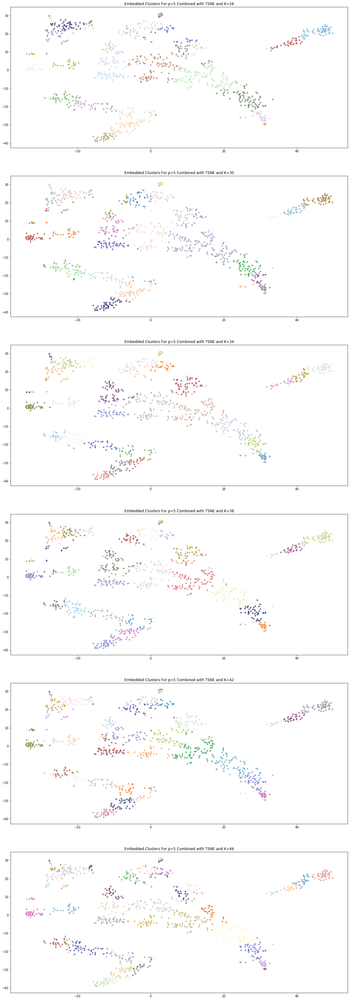

In [16]:
## choose p > 3, for example, p = p_opt, to compute CSE embeddings 
## First, cluster the computed p-dimentional embeddings and then project them onto 2-dimensional space 
## for visualization using PCA, LL, t-SNE or something else
%config InlineBackend.print_figure_kwargs = {'bbox_inches':'tight'}
cluster_options = [26, 30, 34, 38, 42, 46]
fig, ax = plt.subplots(len(cluster_options),1,figsize=(20,60))
counter = 0

for k in cluster_options:
    X_p_denoised_plot = CSE.get_embedded_vectors(p=5)
    kmeans = KMeans(n_clusters=k, random_state=13).fit(X_p_denoised_plot)
    predicted_labels = kmeans.predict(X_p_denoised_plot)
    embedding = skl.manifold.TSNE(n_components = 2, random_state=13)
    X_tsne = embedding.fit_transform(X_p_denoised_plot)#Transform the whole wine data(unnormalized and unseparated)
    ax[counter].scatter(X_tsne[:, 0], X_tsne[:, 1], c=predicted_labels, s=40, cmap=mymap, marker='+')
    ax[counter].set_title('Embedded Clusters For p=5 Combined with TSNE and K=' +str(k))
    counter = counter + 1


In this section, we get cluster visualizations very similar to those presented in the paper in the sense that in accordance with the apparent clusters in the distance matrices, the distinct clusters are also structured in the 2d embedded space. Even for a very drastic cutoff of only 2 components, we observe that the clusters are somewhat densely packed so that the kmeans algorithm can fairly detect them. For a cutoff of 3 components, with the addition of a new dimension, the seperation of the grouping structure is even more apparent. Finally, choosing the cutoff as 5 and then embedding into 2 dimensions via TSNE, we indeed get very promising results as the clusters are structured and separated greatly even in a 2 dim. embedded space. As the question suggests, we get a more visually appealing clustering due to the 'gentler' choice of $p$.

<h2 style="background-color:#f0b375;">
Section 6.0 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 6.0 </span>
</h2>

<p style="background-color:#adebad;">
Finally, to evaluate the quality of the above derived clusters, let's compare our predictions with the ground truth. We will use the actual member-institution mappings given in [2]. You can reuse code from the previous coding exercises to align the cluster labels with the ground truth.
</p>

The true number of clusters (departments) is:  42


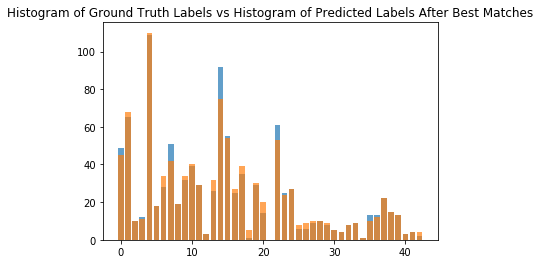

Score: 0.8746268656716418


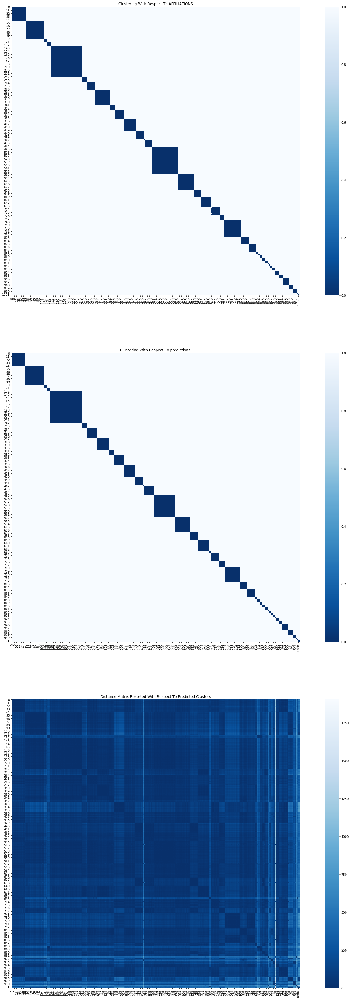

In [17]:
%config InlineBackend.print_figure_kwargs = {'bbox_inches':'tight'}
def hungarian_algorithm_ind(predicted_labels, real_labels):
    
    #Cost_matrix

    cost_matrix = np.zeros( (len(np.unique(predicted_labels)), len(np.unique(real_labels))) )
    #print(12 in np.unique(predicted_perm_label_map))
    #dummy_labels_1 = prediction_matrix(np.sort(predicted_labels))
    #dummy_labels_2 = prediction_matrix(np.sort(real_labels))
    dummy_labels_1 = (predicted_labels).copy()
    dummy_labels_2 = real_labels.copy()
    for prediction in list(np.unique(predicted_labels).astype('int')):
        for label in list(np.unique(real_labels).astype('int')):
            #print(prediction)
            #print(label)
            temp_labels_1 = dummy_labels_1.copy()
            temp_labels_2 = dummy_labels_2.copy()
            
            len1 = len(temp_labels_1[temp_labels_1 == prediction])
            len2 = len(temp_labels_2[temp_labels_2 == label])
            cost_matrix[prediction, label] = np.abs(len1-len2)

    # Hungarian Algorithm

    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    #print(col_ind)
    #print(row_ind)
    counter = 0
    summation = np.zeros( len(predicted_labels)) 
    dummy = predicted_labels.copy()
    for i in list(row_ind):
        placeholder = dummy.copy()
        placeholder[placeholder != i] = -1#PROBLEM FOR i=0!!!!
        placeholder[placeholder == i] = col_ind[counter].copy()
        placeholder[placeholder != col_ind[counter]] = 0
        #print(np.unique(placeholder))
        summation = summation + placeholder
        counter = counter + 1

    predicted_labels_final = summation
    
    return predicted_labels_final

def prediction_matrix(indices_sorted):
    predicted_clusters = np.ones((NUM_NODES,NUM_NODES))
    total_length = 0
    for i in np.unique(indices_sorted):
        length = len(indices_sorted[indices_sorted == i])
        predicted_clusters[total_length:total_length+length,total_length:total_length+length] = np.zeros((length,length))
        total_length = total_length + length
    return predicted_clusters

def calculate_score(predicted_labels, real_labels):
    labels_sorted_gt_plot = np.sort(real_labels)
    labels_sorted_plot = np.sort(predicted_labels)
    score = 0
    for i in np.unique(labels_sorted_gt_plot):
        gt_labels_i = labels_sorted_gt_plot[labels_sorted_gt_plot==i]
        gt_indices_i = np.unique(np.argwhere(labels_sorted_gt_plot==i))
        #print(gt_indices_i)
        pred_labels_i = labels_sorted_plot[gt_indices_i]#Find the predicted labels for the samples that were assigned label i
        #print(pred_labels_i)
        most_frequent = np.argmax(np.bincount(pred_labels_i.astype('int')))#Find the most common label in those extracted samples
        pred_labels_i[pred_labels_i==most_frequent] = i
        pred_labels_i[pred_labels_i!=i] = -1
        score = score + np.sum(pred_labels_i == gt_labels_i)

    score_final = score/float(NUM_NODES)
    
    return score_final


# Initialize community members affeliation array
AFFILIATIONS = np.zeros((NUM_NODES, ))

# Fill out the affiliation array
with open("email-Eu-core-department-labels.txt") as file:
    for line in file:
        pair = [int(x) for x in line.split()]
        AFFILIATIONS[pair[0]] = pair[1]

# Number of organizations is 
print("The true number of clusters (departments) is: ",len(np.unique(AFFILIATIONS)))

plt.bar(np.arange(43),np.histogram(AFFILIATIONS, bins=43)[0],alpha=0.7)


X_p_denoised = CSE.get_embedded_vectors(p=p_opt)
random_seeds = np.arange(1000,2000,1)
#scores = []
#for i in random_seeds:
    #kmeans = KMeans(n_clusters=42, random_state=i).fit(X_p_denoised)
    #predicted_labels = kmeans.predict(X_p_denoised)
    #predicted_labels_final = hungarian_algorithm_ind(predicted_labels, AFFILIATIONS)
    #scores.append(1-np.sum(np.abs(np.histogram(predicted_labels_final, bins=43)[0] - np.histogram(AFFILIATIONS, bins=43)[0]))/(NUM_NODES))
    #scores.append(np.sum(predicted_labels_final == AFFILIATIONS)/len(AFFILIATIONS))
    #scores.append(np.sum((np.sort(AFFILIATIONS)==np.sort(predicted_labels_final)))/len(AFFILIATIONS))
    #scores.append(calculate_score(predicted_labels_final, AFFILIATIONS))

#random_seed_opt = random_seeds[np.argmax(scores)]
#print('BEST RANDOM SEED', random_seed_opt)#1041 for 500 thereshold,1827 for 600 threshold, 1524 for 800
#print('worstcase score', np.amin(scores))
#print('WORST RANDOM SEED', random_seeds[np.argmin(scores)])
#kmeans = KMeans(n_clusters=42, random_state=random_seed_opt).fit(X_p_denoised)
kmeans = KMeans(n_clusters=42, random_state=1827).fit(X_p_denoised)#Random initialization slightly fine-tuned
predicted_labels = kmeans.predict(X_p_denoised)
predicted_labels_final = hungarian_algorithm_ind(predicted_labels, AFFILIATIONS)
indices_sorted = np.argsort(predicted_labels_final)
S_tilde = np.matmul(X_p_denoised, np.transpose(X_p_denoised))
D_tilde = convert_to_dissimilarity(S_tilde)
D_tilde_sorted_temp = D_tilde[:,indices_sorted]
D_tilde_sorted = D_tilde_sorted_temp[indices_sorted,:]
#print('indicessorted:',indices_sorted_gt)


#np.savetxt('aff', AFFILIATIONS, delimiter=',')
#np.savetxt('pred', predicted_labels, delimiter=',')

indices_sorted_gt = np.sort(AFFILIATIONS)
indices_sorted_for_func = np.sort(predicted_labels_final)
#print('indicessorted:',indices_sorted_gt)


plt.bar(np.arange(43),np.histogram(predicted_labels_final, bins=43)[0],alpha=0.7)
plt.title('Histogram of Ground Truth Labels vs Histogram of Predicted Labels After Best Matches')
plt.show()

ideal_clusters = prediction_matrix(indices_sorted_gt)
predicted_clusters = prediction_matrix(indices_sorted_for_func)
#predicted_clusters = D_tilde_sorted

fig, ax = plt.subplots(3,1,figsize=(30,60))
g = ax.copy()

g[0] = sns.heatmap(ideal_clusters, ax=ax[0],cmap="Blues_r")
g[0].set_title('Clustering With Respect To AFFILIATIONS')
ax[0].set_aspect(1.0)
g[1] = sns.heatmap(predicted_clusters, ax=ax[1],cmap="Blues_r")#INTERCHANGABLE WITH IDEAL_CLUSTERS
g[1].set_title('Clustering With Respect To predictions ')
ax[1].set_aspect(1.0)
g[2] = sns.heatmap(D_tilde_sorted, ax=ax[2],cmap="Blues_r")#INTERCHANGABLE WITH IDEAL_CLUSTERS
g[2].set_title('Distance Matrix Resorted With Respect To Predicted Clusters')
ax[2].set_aspect(1.0)

score = np.sum((np.sort(AFFILIATIONS)==np.sort(predicted_labels_final)))/len(AFFILIATIONS)
#score = np.sum(predicted_labels_final == AFFILIATIONS)/len(AFFILIATIONS)
#score = 1-np.sum(np.abs(np.histogram(predicted_labels_final, bins=43)[0] - np.histogram(AFFILIATIONS, bins=43)[0]))/(NUM_NODES)
#score = calculate_score(predicted_labels_final, AFFILIATIONS)   
print('Score:',score)

    

<p style="background-color:#adebad;">
Visually or quantitatively, in a clever and convincing way, show that the K-MEANS generated clusters overlap with the ground truth clusters (member affiliations). How can we measure the overlapping of the predicted and true clusters?
</p>

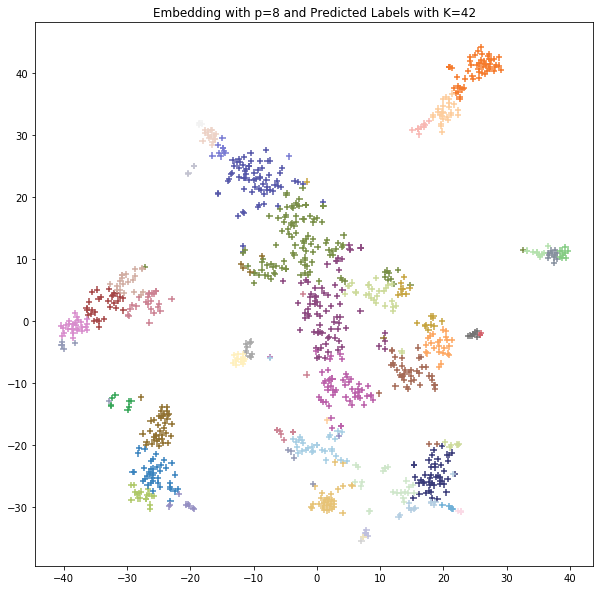

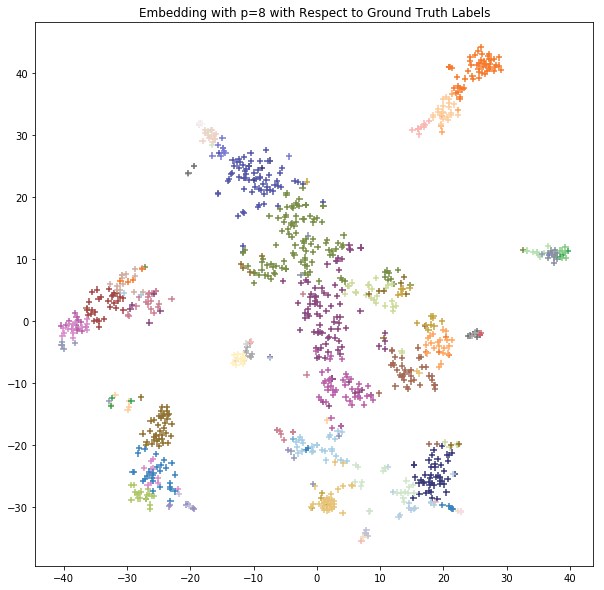

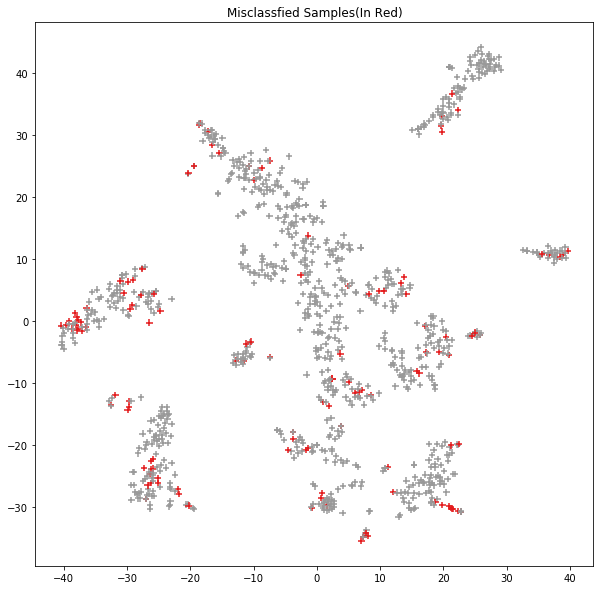

Score: 0.8746268656716418


In [19]:
## Here you can provide plots and calculations
%config InlineBackend.print_figure_kwargs = {'bbox_inches':'tight'}
colors1 = plt.cm.tab20b(np.linspace(0., 1, 20))
colors2 = plt.cm.tab20c(np.linspace(0., 1, 20))
colors3 = plt.cm.Pastel1(np.linspace(0., 1, 9))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2,colors3))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

kmeans = KMeans(n_clusters=42, random_state=1827).fit(X_p_denoised)#1051(1014) is the worst case, 1827(1169) best
predicted_labels = kmeans.predict(X_p_denoised)
predicted_labels_final = hungarian_algorithm_ind(predicted_labels, AFFILIATIONS)

indices_sorted_plot = np.argsort(predicted_labels_final)
labels_sorted_plot = np.sort(predicted_labels_final)
indices_sorted_gt_plot = np.argsort(AFFILIATIONS)
labels_sorted_gt_plot = np.sort(AFFILIATIONS)
#np.savetxt('pred.csv', labels_sorted_plot, delimiter=',')
#np.savetxt('aff.csv', labels_sorted_gt_plot, delimiter=',')

embedding = skl.manifold.TSNE(n_components = 2, random_state=91)
X_tsne = embedding.fit_transform(X_p_denoised)#Transform the whole wine data(unnormalized and unseparated)
X_tsne_predicted = X_tsne[indices_sorted_plot,:]
#X_tsne_predicted = X_p_denoised[indices_sorted_plot,:]

plt.figure(figsize=(10, 10))
plt.scatter(X_tsne_predicted[:, 0], X_tsne_predicted[:, 1], c=labels_sorted_plot, s=40, cmap=mymap, marker='+')
plt.title('Embedding with p=8 and Predicted Labels with K=42')
plt.show()

embedding = skl.manifold.TSNE(n_components = 2, random_state=91)
X_tsne = embedding.fit_transform(X_p_denoised)
X_tsne_real = X_tsne[indices_sorted_plot,:]#AGAIN, NEED TO SORT WRT THE ARGSORTED PREDICTED LABELS INSTEAD OF ARGSORTED REAL LABELS
#SINCE BY THE HUNGARIAN ALGORITHM, THE CLUSTERS ARE ASSIGNED TO THE OVERLAPPING INDICES BUT THEY ARE AT DOFFERENT LOCATIONS SO
#WE SORT THE LABELS (AND SAMPLES) WITH RESPECT TO THE SAME REFERENCE WHICH IS WITH RESPECT TO THE LABEL ASSIGNMENTS IN PREDICTION
#X_tsne_real = X_p_denoised[indices_sorted_plot,:]

plt.figure(figsize=(10, 10))
plt.scatter(X_tsne_real[:, 0], X_tsne_real[:, 1], c=labels_sorted_gt_plot, s=40, cmap=mymap, marker='+')
plt.title('Embedding with p=8 with Respect to Ground Truth Labels')
plt.show()

plt.figure(figsize=(10, 10))
plt.scatter(X_tsne_real[:, 0], X_tsne_real[:, 1], c=(labels_sorted_gt_plot==labels_sorted_plot), s=40, cmap='Set1', marker='+')
plt.title('Misclassfied Samples(In Red)')
plt.show()

#score_final = calculate_score(predicted_labels_final, AFFILIATIONS)
score_final = np.sum(np.sort(predicted_labels_final)==np.sort(AFFILIATIONS))/len(AFFILIATIONS)
print('Score:',score_final)

#print(np.sum(labels_sorted_gt_plot==labels_sorted_plot)/len(AFFILIATIONS))
    


In this section, we have mainly compared the performance of the CSE model approximation together with Kmeans clustering to the ground truth labels. In the first part of this comparison, we have implemented once again, the CSE model with a reconstruction cutoff of $p^*=8$ which was optimally determined previously. Moreover, in order to find the best matches between the predicted and ground truth clusters, the hungarian algorithm used in the 3rd coding assignment was reused and the cluster assignments were optimally matched as to have each matched cluster contain as similar number of samples as possible. This optimal assignment was shown to be promising from the plotted histograms of both the predicted and the ground truth labels in the above figures. We notice from the plotted histogram in the first cell, how well the predicted clusters indeed match the ground truth labels in terms of the cluster sizes. Then, since our clustering principle relies on naive kmeans clustering which is highly dependent on the random initializaitons, we had to run the kmeans algorithm on the reconstructed components for a wide range of random seeds to monitor the variation of the clustering performance with the specified parameters. We observed that,for a locally optimum case, the assignments had over 88% accuracies, which is satisfactory, considering that we have 42 clusters which are even worse, imbalanced. These results were complemented by the plotted graph-like clustering structures in the 1st cell which had a high structural and order-wise similarity. Thus, we fine-tuned the initialization of the kmeans algorithm slightly for optimal performance.

As further proof of the good clustering performance, as performed in the reference paper, the embedded and clustered vectors are plotted with respect to both the ground truth labels and the predicted labels that are optimally matched to the real labels. We notice that as anticipated, there is a clear seperation of most clusters and almost all of the clusters are well structured and compact. Moreover, the ground truth clusters are almost identical to the predicted clusters in accordance with the previous results. In order to obtain such a plot, we were required to rearrange the matched real and predicted labels such that the previously scrambled sample indices of each matching clusters would overlap. For this purpose, these label maps were re-sorted in increasing order with respect to the numerical values of the assigned clusters such that now, both the clusters would be optimally matched and moreover, the samples which are supposed to be assigned to the same cluster in the two label maps would also overlap and our plot would make sense. We of course re arragned the embedded vectors accordingly as well in order to attain the same color mapping. Visually, the provided clustered feature vectors are a clear indication of the satisfactory overlap of the cluster assignments. Therefore, as descirbed in the above paragraph, while the plotted histograms of best matched clusters are a sign of satisfactory performance in terms of the clusters being formed in adequate sizes, the above visualizations guarantee that the indices that belong to each matched cluster indeed do overlap such that the model captures both clusters containing the correct number of samples and at the correct indices. Moreover, if one would like to quantify the performance of clustering, this information can easily be recovered from the above plots due to the way that they are constructed optimally. We notice that upon finetuning the kmeans algorithm, the associated assignment values in the two label maps almost perfectly allign as expected. In this case, the accuracy score can naively be estimated via comparing where the two label maps are equal since we would again expect the samples of each cluster to be alligned as well. Thus, with this metric, the score is approximated as 88%. In the cases where the poor random initialization causes poorer accuracy scores, there is an inevitable shift of matched cluster indices due to the clusters with imbalanced samples so this naive score estimation doesn't hold and it is non-trivial to quantify the score since the best matchind indices will shift with respect to one another when plotting. However, if one plots these worst case plots by setting the random seed appropiately, it is noticed that the color map is shifted due to the mentioned effect, however, the grouped samples and the clustering structures mostly remain intact such that the algorithm still operates decently. In other words, the algorithm in fact finds the correct clusters with reasonable accuracy, only with different integer values assigned to indicate each cluster. Therefore, it is genrally more advisable to monitor the desired clustering structures via the plots of the embedded features. It is much more convenient and reliable to measure the overlap between the predicted and real clusters visually since it eliminates the abstraction made by numerical assignments of clusters which may be misleading due to the imbalance of the clusters and the resulting shift effect. On the other hand, via the above plots, we clearly observe the grouping structures generally do overlap with high accuracies even if different clusters are encoded with different colors. In either case, it is clear that the algorithm indeed manages to 'learn' the compact structures that correspond to each community which is the core purpose of clustering.


## Comments

We hope you found this exercise instructive.

Feel free to leave comments below, we will read them carefully.

1) Necessary explanations for the experiments are provided at each associated section via comments or markdown cells.